In [1]:
# Install Pytorch
# !pip install torch torchvision torchaudio --index-url https://download.pytorch.org/whl/cu121

# Install the ultralytics package from PyPI
# !pip install ultralytics

In [2]:
from ultralytics import YOLO

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import cv2
from PIL import Image

import os
import yaml
import tqdm
import glob

Configuration

In [3]:
BASE_MODEL = 'yolov8x.pt'

DATASET_DIR = 'D:/Projects/ppe/archive/css-data'
OUTPUT_DIR = './'
FOLDERS = ['images', 'labels']

CLASSES = ['Hardhat', 'Mask', 'NO-Hardhat', 'NO-Mask', 'NO-Safety Vest', 'Person', 'Safety Cone', 'Safety Vest', 'machinery', 'vehicle']

EPOCHS = 100
BATCH_SIZE = 8

FRACTION = 1.0
SEED = 88

BASE_MODEL_WEIGHTS = f'{BASE_MODEL}.pt'
EXP_NAME = f'ppe_{EPOCHS}_epochs'

OPTIMIZER = 'auto' # SGD, Adam, Adamax, AdamW, NAdam, RAdam, RMSProp, auto
LR = 1e-3
LR_FACTOR = 0.01
WEIGHT_DECAY = 5e-4
DROPOUT = 0.0
PATIENCE = 20
PROFILE = False
LABEL_SMOOTHING = 0.0

Create YAML file for Yolo

In [4]:
yaml_file = {
    'train': os.path.join(DATASET_DIR, 'train'),
    'val': os.path.join(DATASET_DIR, 'valid'),
    'test': os.path.join(DATASET_DIR, 'test'),
    'names': CLASSES,
    'nc': len(CLASSES)
}

with open(os.path.join(OUTPUT_DIR, 'data.yaml'), 'w+') as f:
    yaml.dump(yaml_file, f)

Metadata about dataset

In [5]:
train_path = os.path.join(DATASET_DIR, 'train')
valid_path = os.path.join(DATASET_DIR, 'valid')
test_path = os.path.join(DATASET_DIR, 'test')

train_filenames = sorted(os.listdir(os.path.join(train_path, FOLDERS[0])))
valid_filenames = sorted(os.listdir(os.path.join(valid_path, FOLDERS[0])))
test_filenames = sorted(os.listdir(os.path.join(test_path, FOLDERS[0])))
train_labels = sorted(os.listdir(os.path.join(train_path, FOLDERS[1])))
valid_labels = sorted(os.listdir(os.path.join(valid_path, FOLDERS[1])))
test_labels = sorted(os.listdir(os.path.join(test_path, FOLDERS[1])))

df = pd.DataFrame()
df['filenames'] = train_filenames + valid_filenames + test_filenames
df['labelnames'] = train_labels + valid_labels + test_labels
df['train_id'] = [0]*len(train_filenames) + [1]*len(valid_filenames) + [2]*len(test_filenames)

train_dict = dict(train=0, valid=1, test=2)
train_keys = list(train_dict.keys())

class_dict = dict(zip(range(len(CLASSES)), CLASSES))

Visualize data

In [6]:
def yolo_annotation_to_bbox(annotation, img_height, img_width):
    sh = annotation.shape
    if len(sh)==0:
        print("No bounding box found")
    if len(sh)==1:
        annotation = annotation.reshape(1, -1)
    num_bbox = len(annotation)
    bbox_list = []
    for idx in range(num_bbox):
        c_x, c_y, w, h = annotation[idx][1:]
        x1 = ((c_x - w/2)*img_width).astype(int)
        x2 = ((c_x + w/2)*img_width).astype(int)
        y1 = ((c_y - h/2)*img_height).astype(int)
        y2 = ((c_y + h/2)*img_height).astype(int)
        bbox_list.append([x1, y1, x2, y2])
    return bbox_list

In [7]:
annotation_files = (DATASET_DIR + '/' + df.train_id.map(lambda x: train_keys[x]) + '/' + FOLDERS[1]
                    + '/' + df.labelnames).tolist()
t_id = df.train_id.tolist()
counts = []
invalid_idx = []
is_annotated = []
for idx, annotation_file in tqdm.tqdm(enumerate(annotation_files)):
    annotation = np.loadtxt(annotation_file)
    if len(annotation)==0:
        invalid_idx.append(idx)
        is_annotated.append(-1)
        counts.append([])
        continue
    if len(annotation.shape)==1:
        annotation = annotation.reshape(1, -1)
    counts.append(annotation[:,0].astype(int))
    is_annotated.append(1)
df['is_annotated'] = is_annotated

invalid_files = df.filenames[invalid_idx]

898it [00:02, 303.84it/s]C:\Users\manzil\AppData\Local\Temp\ipykernel_10784\1201600725.py:8: UserWarning: loadtxt: input contained no data: "D:/Projects/ppe/archive/css-data/train/labels/construction-1-_mp4-115_jpg.rf.7afe87b728c11bfa2d6616ef75081e4c.txt"
  annotation = np.loadtxt(annotation_file)
1152it [00:03, 305.85it/s]C:\Users\manzil\AppData\Local\Temp\ipykernel_10784\1201600725.py:8: UserWarning: loadtxt: input contained no data: "D:/Projects/ppe/archive/css-data/train/labels/construction-4-_mp4-19_jpg.rf.b39073990b499b99dfe415a49fdb90bb.txt"
  annotation = np.loadtxt(annotation_file)
1217it [00:04, 310.52it/s]C:\Users\manzil\AppData\Local\Temp\ipykernel_10784\1201600725.py:8: UserWarning: loadtxt: input contained no data: "D:/Projects/ppe/archive/css-data/train/labels/construction-5-_mp4-30_jpg.rf.f671ac8915234f2ca8b9246d095055e9.txt"
  annotation = np.loadtxt(annotation_file)
1345it [00:04, 315.19it/s]C:\Users\manzil\AppData\Local\Temp\ipykernel_10784\1201600725.py:8: UserWarni

In [8]:
def visualize_samples(mode = 'train', n_samples = 12):
    # Visualize only those files which have annotations 
    indices = df[(~df.filenames.isin(invalid_files))&(df.train_id==1)].sample(n_samples).index
    filenames = (DATASET_DIR + '/' + df.train_id[indices].apply(lambda x: train_keys[x]) + '/' + FOLDERS[0] + '/' + df.filenames[indices]).tolist()
    annotations = (DATASET_DIR + '/' + df.train_id[indices].apply(lambda x: train_keys[x]) + '/' + FOLDERS[1] + '/' + df.labelnames[indices]).tolist()
    plt.figure(figsize = (25, 25))
    plt.title('{} Set Samples'.format(mode.upper()))
    for idx in range(len(filenames)):
        image = np.array(Image.open(filenames[idx]))
        height, width, _ = image.shape 
        annotation = np.loadtxt(annotations[idx])
        bbox_list = yolo_annotation_to_bbox(annotation, height, width)
        if len(annotation.shape)==1:
            annotation = annotation.reshape(1, -1)
        labels = [class_dict[item] for item in annotation[:,0].astype(int)]
        plt.subplot(4, 3, idx + 1)
        for label, bbox in zip(labels, bbox_list):
            x1, y1, x2, y2 = bbox
            cv2.rectangle(image, (x1, y1), (x2, y2), (0, 255, 0), 2)
            cv2.putText(image, label, (x1, y1-5), cv2.FONT_HERSHEY_SIMPLEX, 0.6, (255, 0, 0), 2)
        plt.imshow(image)
    plt.tight_layout()
    plt.show()

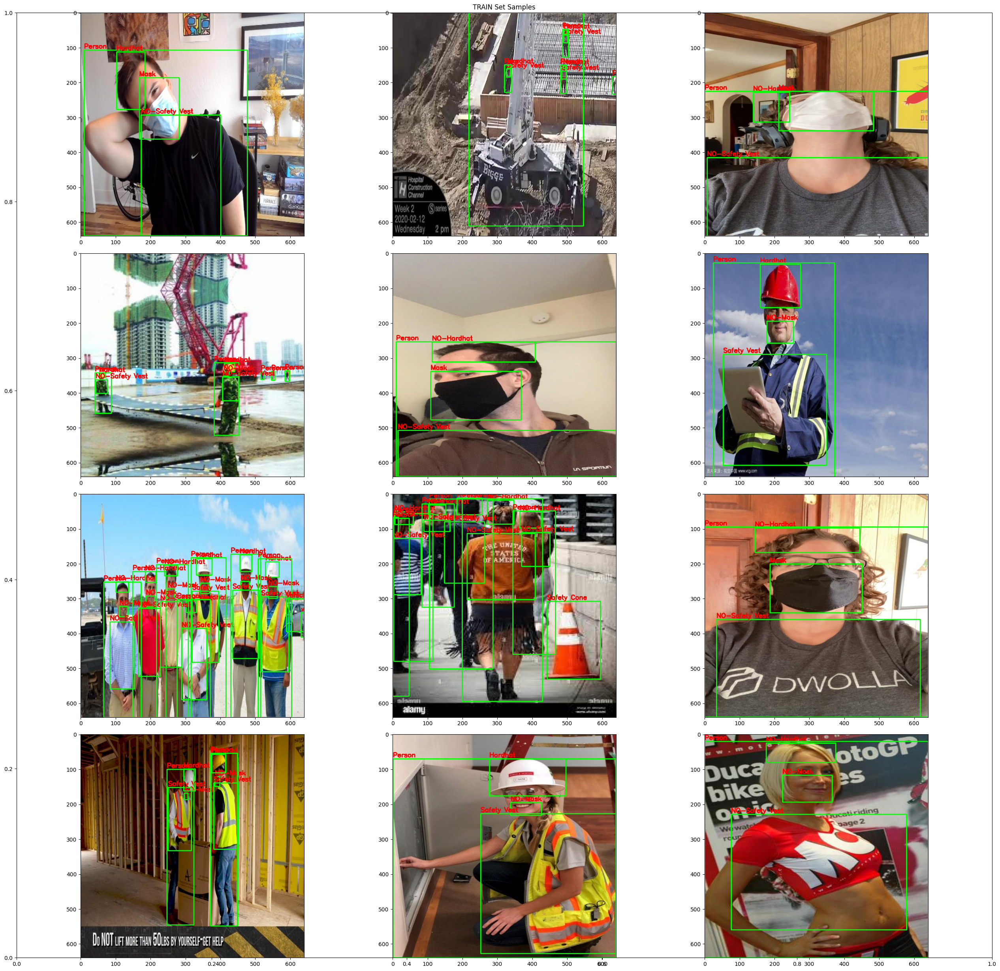

In [9]:
visualize_samples(mode = 'train', n_samples = 12)

In [19]:
def display_image(image, print_info = True, hide_axis = False):
    if isinstance(image, str):  # Check if it's a file path
        img = Image.open(image)
        plt.imshow(img)
    elif isinstance(image, np.ndarray):  # Check if it's a NumPy array
        image = image[..., ::-1]  # BGR to RGB
        img = Image.fromarray(image)
        plt.imshow(img)
    else:
        raise ValueError("Unsupported image format")

    if print_info:
        print('Type: ', type(img), '\n')
        print('Shape: ', np.array(img).shape, '\n')

    if hide_axis:
        plt.axis('off')

    plt.show()

Image properties

In [12]:
def get_image_properties(image_path):
    # Read the image file
    img = cv2.imread(image_path)

    # Check if the image file is read successfully
    if img is None:
        raise ValueError("Could not read image file")

    # Get image properties
    properties = {
        "width": img.shape[1],
        "height": img.shape[0],
        "channels": img.shape[2] if len(img.shape) == 3 else 1,
        "dtype": img.dtype,
    }

    return properties

In [13]:
# Retrieve properties of a randomly selected training image
random_image_index = np.random.choice(len(train_filenames))
random_image_path = train_filenames[random_image_index]

random_image_path = os.path.join(DATASET_DIR, train_keys[0], FOLDERS[0], random_image_path)

img_properties = get_image_properties(random_image_path)
img_properties

{'width': 640, 'height': 640, 'channels': 3, 'dtype': dtype('uint8')}

Load Model

In [14]:
print('Epochs: ', EPOCHS)
print('Batch: ', BATCH_SIZE)

Epochs:  100
Batch:  8


In [15]:
model = YOLO(BASE_MODEL)
model.info()

YOLOv8x summary: 365 layers, 68229648 parameters, 0 gradients, 258.5 GFLOPs


(365, 68229648, 0, 258.5472512)

Train the model

In [16]:
%%time

### train
model.train(
    data = 'data.yaml',

    task = 'detect',

    imgsz = (img_properties['height'], img_properties['width']),

    epochs = EPOCHS,
    batch = BATCH_SIZE,
    optimizer = OPTIMIZER,
    lr0 = LR,
    lrf = LR_FACTOR,
    weight_decay = WEIGHT_DECAY,
    dropout = DROPOUT,
    fraction = FRACTION,
    patience = PATIENCE,
    profile = PROFILE,
    label_smoothing = LABEL_SMOOTHING,

    name = f'{BASE_MODEL}_{EXP_NAME}',
    seed = SEED,
    
    val = True,
    amp = True,    
    exist_ok = True,
    resume = False,
    device = 0,
    verbose = False
)

New https://pypi.org/project/ultralytics/8.1.20 available 😃 Update with 'pip install -U ultralytics'
Ultralytics YOLOv8.1.18 🚀 Python-3.11.8 torch-2.1.0+cu121 CUDA:0 (NVIDIA GeForce RTX 3080, 10239MiB)
engine\trainer: task=detect, mode=train, model=yolov8x.pt, data=data.yaml, epochs=100, time=None, patience=20, batch=8, imgsz=(640, 640), save=True, save_period=-1, cache=False, device=0, workers=8, project=None, name=yolov8x.pt_ppe_100_epochs, exist_ok=True, pretrained=True, optimizer=auto, verbose=False, seed=88, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None

train: Scanning D:\Projects\ppe\archive\css-data\train\labels.cache... 2605 images, 6 backgrounds, 0 corrupt: 100%|██████████| 2605/2605 [00:00<?, ?it/s]

train: WARNING ⚠️ D:\Projects\ppe\archive\css-data\train\images\004720_jpg.rf.afc486560a4004c7cfd67910af31a29c.jpg: 1 duplicate labels removed
train: WARNING ⚠️ D:\Projects\ppe\archive\css-data\train\images\construction-813-_jpg.rf.b085952261fd98f2e76b8065de149b5f.jpg: 1 duplicate labels removed



val: Scanning D:\Projects\ppe\archive\css-data\valid\labels.cache... 114 images, 10 backgrounds, 0 corrupt: 100%|██████████| 114/114 [00:00<?, ?it/s]


Plotting labels to runs\detect\yolov8x.pt_ppe_100_epochs\labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.001' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000714, momentum=0.9) with parameter groups 97 weight(decay=0.0), 104 weight(decay=0.0005), 103 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to runs\detect\yolov8x.pt_ppe_100_epochs
Starting training for 100 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/100      7.28G       1.25      1.698      1.467         96        640: 100%|██████████| 326/326 [01:37<00:00,  3.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.20it/s]

                   all        114        697      0.478      0.499      0.446      0.194



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/100      7.27G      1.276      1.585       1.49         84        640: 100%|██████████| 326/326 [01:35<00:00,  3.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.43it/s]

                   all        114        697      0.546      0.458      0.458      0.186



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/100      7.26G      1.268      1.571      1.484        137        640: 100%|██████████| 326/326 [01:35<00:00,  3.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.55it/s]

                   all        114        697      0.645        0.5       0.52      0.226



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/100      7.27G      1.231      1.481      1.457         94        640: 100%|██████████| 326/326 [01:35<00:00,  3.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.59it/s]

                   all        114        697      0.657        0.5       0.55      0.246



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/100      7.26G      1.185      1.394      1.417         88        640: 100%|██████████| 326/326 [01:36<00:00,  3.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.68it/s]

                   all        114        697      0.683      0.553      0.602      0.284



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/100      7.26G       1.15      1.282       1.39         87        640: 100%|██████████| 326/326 [01:36<00:00,  3.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.65it/s]

                   all        114        697      0.701       0.58       0.61      0.294



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/100      7.25G      1.115      1.221      1.361         73        640: 100%|██████████| 326/326 [01:36<00:00,  3.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.71it/s]

                   all        114        697      0.815      0.581      0.657      0.311



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/100      7.26G      1.089      1.168      1.348         73        640: 100%|██████████| 326/326 [01:36<00:00,  3.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.73it/s]

                   all        114        697      0.756      0.607      0.656      0.309



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/100      7.27G      1.078      1.138      1.343         71        640: 100%|██████████| 326/326 [01:36<00:00,  3.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.71it/s]

                   all        114        697      0.782      0.595      0.653      0.325



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/100      7.27G      1.051      1.083      1.321        106        640: 100%|██████████| 326/326 [01:36<00:00,  3.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.68it/s]

                   all        114        697      0.795      0.616      0.685      0.355



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/100      7.25G      1.036      1.042      1.305         68        640: 100%|██████████| 326/326 [01:36<00:00,  3.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.71it/s]

                   all        114        697      0.823       0.63      0.709       0.37



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/100      7.28G      1.006      1.005      1.287         84        640: 100%|██████████| 326/326 [01:36<00:00,  3.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.76it/s]

                   all        114        697      0.764      0.655      0.713      0.376



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/100      7.27G      0.999     0.9659      1.279         89        640: 100%|██████████| 326/326 [01:36<00:00,  3.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.77it/s]

                   all        114        697      0.806      0.641      0.711       0.36



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/100      7.27G     0.9728     0.9335      1.264         67        640: 100%|██████████| 326/326 [01:36<00:00,  3.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.77it/s]

                   all        114        697      0.836      0.669      0.735      0.381



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/100      7.26G     0.9687     0.9111      1.258         89        640: 100%|██████████| 326/326 [01:36<00:00,  3.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.76it/s]

                   all        114        697      0.837      0.648       0.73      0.404



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/100      7.28G     0.9403     0.8703      1.239        121        640: 100%|██████████| 326/326 [01:36<00:00,  3.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.77it/s]

                   all        114        697      0.813      0.655      0.725      0.421



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/100      7.27G      0.936     0.8568       1.23         82        640: 100%|██████████| 326/326 [01:36<00:00,  3.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.77it/s]

                   all        114        697      0.854      0.673       0.74      0.416



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/100      7.27G     0.9296     0.8389      1.222        116        640: 100%|██████████| 326/326 [01:36<00:00,  3.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.78it/s]

                   all        114        697      0.841      0.673       0.74      0.428



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/100      7.27G     0.9074     0.7985      1.208         98        640: 100%|██████████| 326/326 [01:36<00:00,  3.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.78it/s]

                   all        114        697      0.852      0.704       0.76      0.431



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/100      7.27G     0.8916     0.7791      1.202        108        640: 100%|██████████| 326/326 [01:36<00:00,  3.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.78it/s]

                   all        114        697      0.852      0.716      0.778      0.449



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/100      7.26G     0.8909     0.7847      1.201        116        640: 100%|██████████| 326/326 [01:36<00:00,  3.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.78it/s]

                   all        114        697      0.839       0.69      0.762      0.448



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/100      7.27G     0.8729     0.7642      1.189        145        640: 100%|██████████| 326/326 [01:36<00:00,  3.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.77it/s]

                   all        114        697      0.865       0.71      0.779       0.46



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/100      7.29G     0.8639     0.7436      1.178         63        640: 100%|██████████| 326/326 [01:36<00:00,  3.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.77it/s]

                   all        114        697      0.852      0.722      0.785      0.452



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/100      7.27G     0.8462     0.7284      1.166        180        640: 100%|██████████| 326/326 [01:36<00:00,  3.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.76it/s]

                   all        114        697      0.864      0.711      0.782      0.482



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/100      7.26G     0.8464     0.7206      1.167        181        640: 100%|██████████| 326/326 [01:36<00:00,  3.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.80it/s]

                   all        114        697      0.894      0.699      0.788       0.48



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/100      7.27G     0.8422     0.7144      1.171        131        640: 100%|██████████| 326/326 [01:36<00:00,  3.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.76it/s]

                   all        114        697      0.845      0.717       0.78      0.485



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/100      7.28G     0.8241     0.6952      1.151        119        640: 100%|██████████| 326/326 [01:36<00:00,  3.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.77it/s]

                   all        114        697      0.879      0.709      0.779      0.464



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/100      7.27G     0.8028     0.6678      1.146         97        640: 100%|██████████| 326/326 [01:36<00:00,  3.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.81it/s]

                   all        114        697      0.896      0.722        0.8      0.495



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/100      7.26G     0.8177     0.6749      1.149        130        640: 100%|██████████| 326/326 [01:36<00:00,  3.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.77it/s]

                   all        114        697      0.857      0.765      0.826       0.51



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/100      7.28G     0.8006     0.6592      1.141        167        640: 100%|██████████| 326/326 [01:36<00:00,  3.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.78it/s]

                   all        114        697      0.879      0.753       0.82      0.521



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/100      7.26G     0.7823     0.6372       1.13         66        640: 100%|██████████| 326/326 [01:36<00:00,  3.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.75it/s]

                   all        114        697       0.89      0.732      0.812      0.518



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/100      7.27G      0.778     0.6322      1.121        104        640: 100%|██████████| 326/326 [01:36<00:00,  3.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.72it/s]

                   all        114        697      0.852      0.764      0.819      0.521



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/100      7.27G     0.7696     0.6259       1.12        102        640: 100%|██████████| 326/326 [01:36<00:00,  3.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.77it/s]

                   all        114        697       0.89      0.758      0.819       0.51



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/100      7.25G     0.7525     0.6023      1.106         75        640: 100%|██████████| 326/326 [01:36<00:00,  3.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.80it/s]

                   all        114        697      0.882      0.767       0.83      0.541



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/100      7.27G     0.7544     0.6172      1.116        128        640: 100%|██████████| 326/326 [01:36<00:00,  3.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.77it/s]

                   all        114        697        0.9       0.76      0.825      0.506



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/100      7.29G     0.7451     0.5906        1.1        136        640: 100%|██████████| 326/326 [01:36<00:00,  3.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.79it/s]

                   all        114        697      0.923      0.763      0.837      0.542



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/100      7.26G     0.7459     0.5979        1.1         63        640: 100%|██████████| 326/326 [01:36<00:00,  3.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.66it/s]

                   all        114        697      0.877      0.774      0.831      0.539



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/100      7.27G     0.7267     0.5735      1.088         62        640: 100%|██████████| 326/326 [01:36<00:00,  3.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.78it/s]

                   all        114        697      0.879       0.77      0.833      0.547



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/100      7.27G     0.7286     0.5733       1.09        126        640: 100%|██████████| 326/326 [01:36<00:00,  3.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.77it/s]

                   all        114        697       0.92      0.753      0.839       0.54



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/100      7.29G     0.7185     0.5641      1.084        145        640: 100%|██████████| 326/326 [01:36<00:00,  3.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.79it/s]

                   all        114        697      0.935      0.766      0.848      0.552



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/100      7.27G     0.7143     0.5624      1.081        103        640: 100%|██████████| 326/326 [01:36<00:00,  3.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.81it/s]

                   all        114        697      0.931      0.761      0.847      0.563



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/100      7.27G      0.714     0.5581      1.081        149        640: 100%|██████████| 326/326 [01:36<00:00,  3.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.80it/s]

                   all        114        697      0.923      0.766      0.843      0.548



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/100      7.29G     0.7043     0.5468      1.074        104        640: 100%|██████████| 326/326 [01:36<00:00,  3.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.76it/s]

                   all        114        697      0.894      0.768      0.848      0.565



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/100      7.28G     0.7006     0.5435      1.065        116        640: 100%|██████████| 326/326 [01:36<00:00,  3.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.78it/s]

                   all        114        697       0.89       0.78      0.843      0.566



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/100      7.28G     0.6942     0.5336      1.068         79        640: 100%|██████████| 326/326 [01:36<00:00,  3.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.79it/s]

                   all        114        697      0.921      0.765      0.852      0.564



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/100      7.27G     0.6874     0.5257      1.059        103        640: 100%|██████████| 326/326 [01:36<00:00,  3.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.78it/s]

                   all        114        697      0.894      0.799      0.858      0.576



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/100      7.28G     0.6762     0.5161      1.051        148        640: 100%|██████████| 326/326 [01:36<00:00,  3.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.81it/s]

                   all        114        697      0.911      0.777      0.849      0.573



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/100      7.27G     0.6798     0.5169      1.058         79        640: 100%|██████████| 326/326 [01:36<00:00,  3.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.78it/s]

                   all        114        697      0.919      0.775      0.852      0.555



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/100      7.27G     0.6684     0.5119      1.052         84        640: 100%|██████████| 326/326 [01:36<00:00,  3.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.81it/s]

                   all        114        697      0.914      0.758      0.847      0.558



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/100      7.26G     0.6666     0.5082       1.05        117        640: 100%|██████████| 326/326 [01:36<00:00,  3.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.81it/s]

                   all        114        697      0.888      0.782      0.853      0.589



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/100      7.26G     0.6535     0.4989      1.048         92        640: 100%|██████████| 326/326 [01:36<00:00,  3.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.80it/s]

                   all        114        697      0.876      0.807      0.855      0.589



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/100      7.47G       0.65     0.4935      1.047        108        640: 100%|██████████| 326/326 [01:36<00:00,  3.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.81it/s]

                   all        114        697      0.945       0.79      0.862      0.592



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/100      7.26G      0.642     0.4887      1.045        130        640: 100%|██████████| 326/326 [01:36<00:00,  3.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.78it/s]

                   all        114        697      0.957      0.772      0.859      0.585



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/100      7.28G     0.6444     0.4841      1.032        122        640: 100%|██████████| 326/326 [01:36<00:00,  3.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.79it/s]

                   all        114        697      0.925      0.802      0.869      0.598



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/100      7.29G     0.6326     0.4752       1.03         97        640: 100%|██████████| 326/326 [01:36<00:00,  3.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.81it/s]

                   all        114        697      0.916      0.779      0.858      0.588



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/100      7.27G     0.6278     0.4641      1.026         61        640: 100%|██████████| 326/326 [01:36<00:00,  3.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.81it/s]

                   all        114        697      0.905      0.799      0.859        0.6



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/100      7.27G     0.6246     0.4694      1.022        130        640: 100%|██████████| 326/326 [01:36<00:00,  3.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.76it/s]

                   all        114        697      0.932      0.784      0.868      0.609



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/100      7.26G     0.6139     0.4575      1.016         79        640: 100%|██████████| 326/326 [01:36<00:00,  3.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.80it/s]

                   all        114        697      0.917      0.799      0.859      0.595



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/100      7.28G     0.6186     0.4603       1.02         90        640: 100%|██████████| 326/326 [01:36<00:00,  3.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.82it/s]

                   all        114        697      0.926      0.788      0.873      0.608



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/100      7.26G     0.6131     0.4561      1.017         80        640: 100%|██████████| 326/326 [01:36<00:00,  3.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.78it/s]

                   all        114        697      0.914      0.807      0.871      0.592



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     61/100      7.27G     0.6095     0.4548       1.01         61        640: 100%|██████████| 326/326 [01:36<00:00,  3.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.82it/s]

                   all        114        697       0.92      0.796      0.858      0.602



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     62/100      7.27G     0.5953     0.4404      1.003        122        640: 100%|██████████| 326/326 [01:36<00:00,  3.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.81it/s]

                   all        114        697      0.927      0.793      0.865      0.598



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     63/100      7.28G      0.589     0.4356      1.002        101        640: 100%|██████████| 326/326 [01:36<00:00,  3.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.80it/s]

                   all        114        697      0.933       0.81      0.869      0.617



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     64/100      7.27G     0.5928     0.4367      1.002         88        640: 100%|██████████| 326/326 [01:36<00:00,  3.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.78it/s]

                   all        114        697      0.927        0.8      0.868      0.605



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     65/100      7.28G     0.5877     0.4321          1        229        640: 100%|██████████| 326/326 [01:36<00:00,  3.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.77it/s]

                   all        114        697      0.917      0.807      0.862      0.607



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     66/100      7.27G     0.5855     0.4237          1         84        640: 100%|██████████| 326/326 [01:36<00:00,  3.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.76it/s]

                   all        114        697      0.923      0.822      0.876      0.612



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     67/100      7.26G     0.5803     0.4237      0.997         68        640: 100%|██████████| 326/326 [01:36<00:00,  3.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.81it/s]

                   all        114        697      0.925      0.826      0.875      0.611



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     68/100      7.28G     0.5675     0.4176     0.9939        117        640: 100%|██████████| 326/326 [01:36<00:00,  3.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.76it/s]

                   all        114        697      0.923      0.815      0.879      0.623



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     69/100      7.26G     0.5643     0.4158     0.9922        110        640: 100%|██████████| 326/326 [01:36<00:00,  3.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.79it/s]

                   all        114        697      0.919      0.829      0.869      0.618



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     70/100      7.28G     0.5629     0.4126     0.9918         66        640: 100%|██████████| 326/326 [01:36<00:00,  3.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.76it/s]

                   all        114        697      0.923      0.822      0.882      0.634



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     71/100      7.27G     0.5555      0.407     0.9846        133        640: 100%|██████████| 326/326 [01:36<00:00,  3.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.76it/s]

                   all        114        697      0.938      0.811      0.878      0.626



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     72/100      7.26G     0.5494     0.3992     0.9864        132        640: 100%|██████████| 326/326 [01:36<00:00,  3.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.80it/s]

                   all        114        697      0.924      0.826      0.881      0.639



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     73/100      7.27G     0.5448     0.3953     0.9777        135        640: 100%|██████████| 326/326 [01:36<00:00,  3.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.74it/s]

                   all        114        697      0.916      0.811      0.872       0.63



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     74/100      7.27G     0.5381     0.3872     0.9729        173        640: 100%|██████████| 326/326 [01:36<00:00,  3.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.78it/s]

                   all        114        697      0.915      0.841       0.88      0.632



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     75/100      7.27G     0.5373     0.3844     0.9752         93        640: 100%|██████████| 326/326 [01:36<00:00,  3.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.80it/s]

                   all        114        697      0.923      0.813      0.873      0.632



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     76/100      7.28G     0.5371     0.3883     0.9716        105        640: 100%|██████████| 326/326 [01:36<00:00,  3.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.79it/s]

                   all        114        697      0.945      0.802      0.882       0.63



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     77/100      7.28G     0.5297     0.3849     0.9684        137        640: 100%|██████████| 326/326 [01:36<00:00,  3.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.81it/s]

                   all        114        697       0.91       0.83      0.881      0.637



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     78/100      7.27G     0.5278     0.3801     0.9729        127        640: 100%|██████████| 326/326 [01:36<00:00,  3.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.80it/s]

                   all        114        697      0.907      0.833      0.883      0.633



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     79/100      7.29G     0.5189     0.3721     0.9646        134        640: 100%|██████████| 326/326 [01:36<00:00,  3.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.77it/s]

                   all        114        697      0.911      0.833      0.883      0.634



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     80/100      7.28G     0.5192      0.373     0.9614         82        640: 100%|██████████| 326/326 [01:36<00:00,  3.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.79it/s]

                   all        114        697      0.933      0.834      0.887      0.635



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     81/100      7.29G     0.5121     0.3708     0.9637        136        640: 100%|██████████| 326/326 [01:36<00:00,  3.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.80it/s]

                   all        114        697      0.944       0.83      0.887      0.643



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     82/100      7.27G     0.5104     0.3683     0.9594         55        640: 100%|██████████| 326/326 [01:36<00:00,  3.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.81it/s]

                   all        114        697      0.929      0.832       0.89      0.645



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     83/100      7.29G     0.4987     0.3585     0.9567         76        640: 100%|██████████| 326/326 [01:36<00:00,  3.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.75it/s]

                   all        114        697      0.932      0.828      0.882      0.643



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     84/100      7.26G     0.5011      0.362      0.959         70        640: 100%|██████████| 326/326 [01:36<00:00,  3.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.79it/s]

                   all        114        697      0.955      0.819      0.885      0.639



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     85/100      7.27G     0.4938     0.3559     0.9541         76        640: 100%|██████████| 326/326 [01:36<00:00,  3.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.80it/s]

                   all        114        697      0.928      0.827      0.888      0.649



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     86/100      7.27G     0.4928       0.35     0.9493        111        640: 100%|██████████| 326/326 [01:36<00:00,  3.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.76it/s]

                   all        114        697      0.925      0.838      0.888      0.655



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     87/100      7.27G     0.4911     0.3499     0.9491         79        640: 100%|██████████| 326/326 [01:36<00:00,  3.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.80it/s]

                   all        114        697      0.946      0.815      0.885      0.653



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     88/100      7.26G     0.4849     0.3487     0.9451        143        640: 100%|██████████| 326/326 [01:36<00:00,  3.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.79it/s]

                   all        114        697       0.93      0.839      0.897      0.659



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     89/100      7.27G     0.4747     0.3378     0.9441        177        640: 100%|██████████| 326/326 [01:36<00:00,  3.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.80it/s]

                   all        114        697      0.941      0.828      0.889      0.647



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     90/100      7.27G     0.4791     0.3425     0.9447         70        640: 100%|██████████| 326/326 [01:36<00:00,  3.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.75it/s]

                   all        114        697       0.93      0.849      0.894      0.651


Closing dataloader mosaic

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     91/100      7.26G     0.4699     0.2822      0.926         46        640: 100%|██████████| 326/326 [01:35<00:00,  3.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.80it/s]

                   all        114        697      0.949      0.815      0.884      0.643



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     92/100      7.27G     0.4561     0.2732     0.9148         57        640: 100%|██████████| 326/326 [01:35<00:00,  3.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.82it/s]

                   all        114        697      0.935      0.835      0.891      0.645



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     93/100      7.26G      0.452      0.271     0.9154        114        640: 100%|██████████| 326/326 [01:35<00:00,  3.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.82it/s]

                   all        114        697      0.928      0.844       0.89      0.655



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     94/100      7.26G     0.4429     0.2656     0.9136         77        640: 100%|██████████| 326/326 [01:36<00:00,  3.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.82it/s]

                   all        114        697      0.943      0.835      0.889      0.654



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     95/100      7.25G     0.4384     0.2636     0.9083         43        640: 100%|██████████| 326/326 [01:36<00:00,  3.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.81it/s]

                   all        114        697      0.943      0.831       0.89       0.66



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     96/100      7.29G     0.4265     0.2558     0.9018         62        640: 100%|██████████| 326/326 [01:36<00:00,  3.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.79it/s]

                   all        114        697      0.939      0.838      0.889      0.658



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     97/100      7.27G     0.4238     0.2575     0.9015         66        640: 100%|██████████| 326/326 [01:36<00:00,  3.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.79it/s]

                   all        114        697      0.947      0.835      0.894      0.658



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     98/100      7.27G     0.4179     0.2514     0.8974         49        640: 100%|██████████| 326/326 [01:36<00:00,  3.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.80it/s]

                   all        114        697      0.947      0.842      0.897      0.664



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     99/100      7.26G     0.4203     0.2542     0.9013         52        640: 100%|██████████| 326/326 [01:36<00:00,  3.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.81it/s]

                   all        114        697      0.948      0.836      0.894      0.661



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    100/100      7.28G     0.4122     0.2468     0.8984         60        640: 100%|██████████| 326/326 [01:36<00:00,  3.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  4.79it/s]

                   all        114        697      0.946      0.839      0.897      0.663



100 epochs completed in 2.780 hours.
Optimizer stripped from runs\detect\yolov8x.pt_ppe_100_epochs\weights\last.pt, 136.8MB
Optimizer stripped from runs\detect\yolov8x.pt_ppe_100_epochs\weights\best.pt, 136.8MB

Validating runs\detect\yolov8x.pt_ppe_100_epochs\weights\best.pt...
Ultralytics YOLOv8.1.18 🚀 Python-3.11.8 torch-2.1.0+cu121 CUDA:0 (NVIDIA GeForce RTX 3080, 10239MiB)
Model summary (fused): 268 layers, 68133198 parameters, 0 gradients, 257.4 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:02<00:00,  3.51it/s]


                   all        114        697      0.947      0.842      0.897      0.663
Speed: 1.3ms preprocess, 11.4ms inference, 0.0ms loss, 0.8ms postprocess per image
Results saved to runs\detect\yolov8x.pt_ppe_100_epochs
CPU times: total: 2h 17min 7s
Wall time: 2h 47min 32s


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1, 2, 3, 4, 5, 6, 7, 8, 9])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x0000024ABD83D010>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,   

Export the model

In [17]:
model.export(
    format = 'openvino', # openvino, onnx, engine, tflite
    imgsz = (img_properties['height'], img_properties['width']),
    half = False,
    int8 = False,
    simplify = False,
    nms = False,
)

Ultralytics YOLOv8.1.18 🚀 Python-3.11.8 torch-2.1.0+cu121 CUDA:0 (NVIDIA GeForce RTX 3080, 10239MiB)
Model summary (fused): 268 layers, 68133198 parameters, 0 gradients, 257.4 GFLOPs

PyTorch: starting from 'runs\detect\yolov8x.pt_ppe_100_epochs\weights\best.pt' with input shape (1, 3, 640, 640) BCHW and output shape(s) (1, 14, 8400) (130.4 MB)

ONNX: starting export with onnx 1.15.0 opset 17...
ONNX: export success ✅ 4.5s, saved as 'runs\detect\yolov8x.pt_ppe_100_epochs\weights\best.onnx' (260.1 MB)

OpenVINO: starting export with openvino 2023.3.0-13775-ceeafaf64f3-releases/2023/3...
OpenVINO: export success ✅ 2.3s, saved as 'runs\detect\yolov8x_openvino_model\_ppe_100_epochs\weights\best_openvino_model\' (260.3 MB)

Export complete (8.0s)
Results saved to D:\Projects\ppe\runs\detect\yolov8x.pt_ppe_100_epochs\weights
Predict:         yolo predict task=detect model=runs\detect\yolov8x_openvino_model\_ppe_100_epochs\weights\best_openvino_model imgsz=640  
Validate:        yolo val task

'runs\\detect\\yolov8x_openvino_model\\_ppe_100_epochs\\weights\\best_openvino_model'

Visualize the results

In [18]:

results_paths = [
    i for i in
    glob.glob(f'{OUTPUT_DIR}runs/detect/{BASE_MODEL}_{EXP_NAME}/*.png') +
    glob.glob(f'{OUTPUT_DIR}runs/detect/{BASE_MODEL}_{EXP_NAME}/*.jpg')
    if 'batch' not in i
]

results_paths

['./runs/detect/yolov8x.pt_ppe_100_epochs\\confusion_matrix.png',
 './runs/detect/yolov8x.pt_ppe_100_epochs\\confusion_matrix_normalized.png',
 './runs/detect/yolov8x.pt_ppe_100_epochs\\F1_curve.png',
 './runs/detect/yolov8x.pt_ppe_100_epochs\\PR_curve.png',
 './runs/detect/yolov8x.pt_ppe_100_epochs\\P_curve.png',
 './runs/detect/yolov8x.pt_ppe_100_epochs\\results.png',
 './runs/detect/yolov8x.pt_ppe_100_epochs\\R_curve.png',
 './runs/detect/yolov8x.pt_ppe_100_epochs\\labels.jpg',
 './runs/detect/yolov8x.pt_ppe_100_epochs\\labels_correlogram.jpg']

./runs/detect/yolov8x.pt_ppe_100_epochs\F1_curve.png


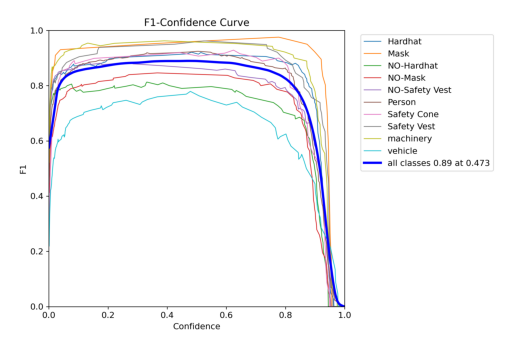



./runs/detect/yolov8x.pt_ppe_100_epochs\PR_curve.png


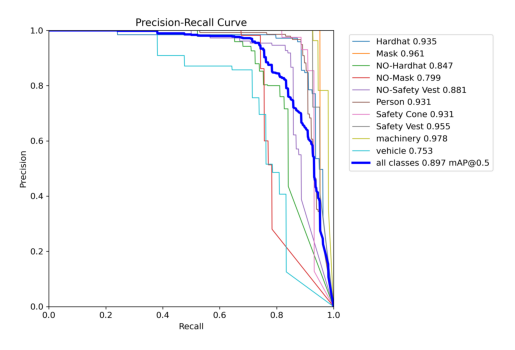



./runs/detect/yolov8x.pt_ppe_100_epochs\P_curve.png


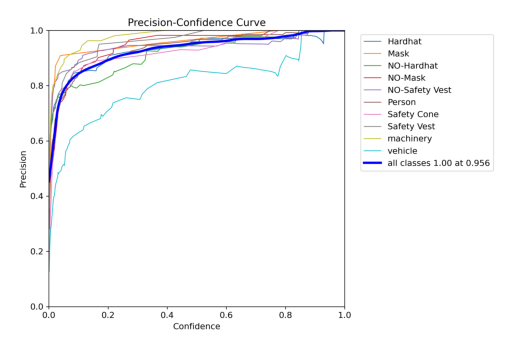



./runs/detect/yolov8x.pt_ppe_100_epochs\R_curve.png


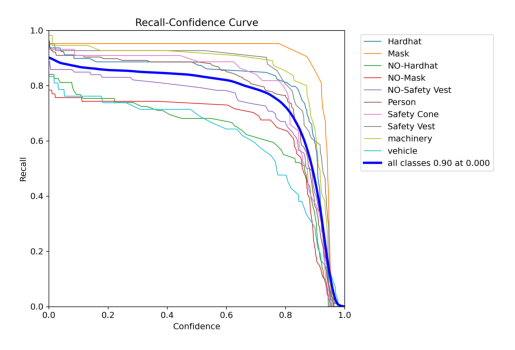



./runs/detect/yolov8x.pt_ppe_100_epochs\confusion_matrix.png


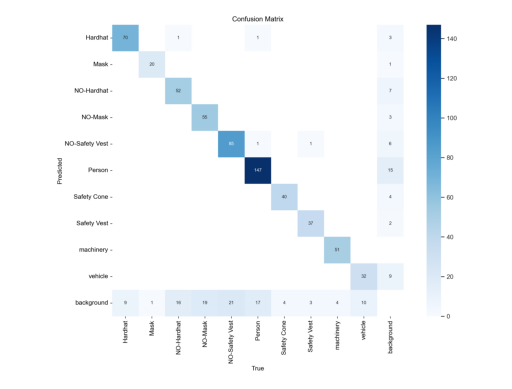



./runs/detect/yolov8x.pt_ppe_100_epochs\confusion_matrix_normalized.png


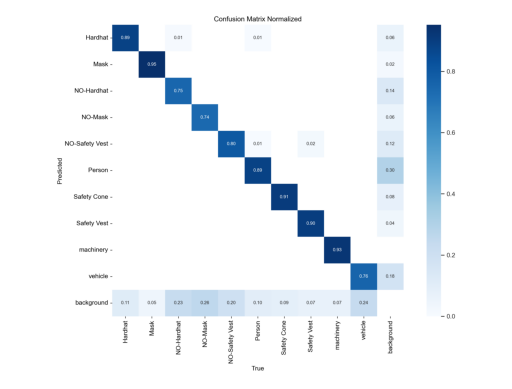



./runs/detect/yolov8x.pt_ppe_100_epochs\labels.jpg


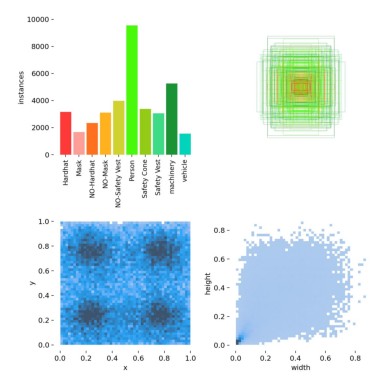



./runs/detect/yolov8x.pt_ppe_100_epochs\labels_correlogram.jpg


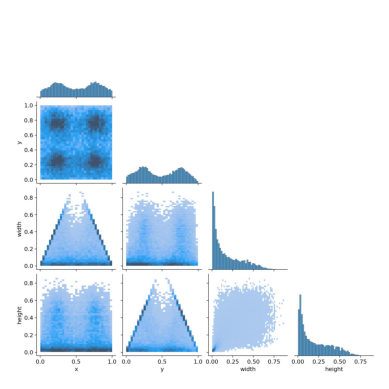



./runs/detect/yolov8x.pt_ppe_100_epochs\results.png


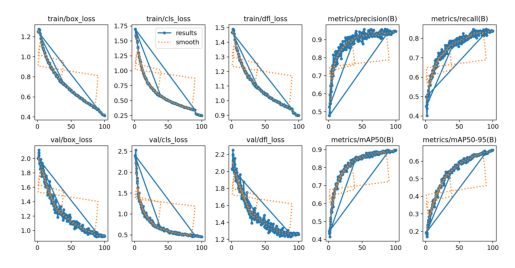

In [20]:
for file in sorted(results_paths):
    print(file)
    display_image(file, print_info = False, hide_axis = True)
    print('\n')

In [22]:
df = pd.read_csv(f'{OUTPUT_DIR}runs/detect/{BASE_MODEL}_{EXP_NAME}/results.csv')
df = df.rename(columns=lambda x: x.replace(" ", ""))
df.to_csv(f'{OUTPUT_DIR}training_log_df.csv', index=False)

print('*'*50)
print('\nBest Training Box loss: ', df['train/box_loss'].min(), ', on epoch: ', df['train/box_loss'].argmin() + 1, '\n')
print('\nBest Validation Box loss: ', df['val/box_loss'].min(), ', on epoch: ', df['val/box_loss'].argmin() + 1, '\n')

print('='*50)
print('\nBest Training Cls loss: ', df['train/cls_loss'].min(), ', on epoch: ', df['train/box_loss'].argmin() + 1, '\n')
print('\nBest Validation Cls loss: ', df['val/cls_loss'].min(), ', on epoch: ', df['val/box_loss'].argmin() + 1, '\n')

print('='*50)
print('\nBest Training DFL loss: ', df['train/dfl_loss'].min(), ', on epoch: ', df['train/box_loss'].argmin() + 1, '\n')
print('\nBest Validation DFL loss: ', df['val/dfl_loss'].min(), ', on epoch: ', df['val/box_loss'].argmin() + 1, '\n')

**************************************************

Best Training Box loss:  0.41223 , on epoch:  233 


Best Validation Box loss:  0.91326 , on epoch:  221 


Best Training Cls loss:  0.24678 , on epoch:  233 


Best Validation Cls loss:  0.45488 , on epoch:  221 


Best Training DFL loss:  0.89742 , on epoch:  233 


Best Validation DFL loss:  1.231 , on epoch:  221 



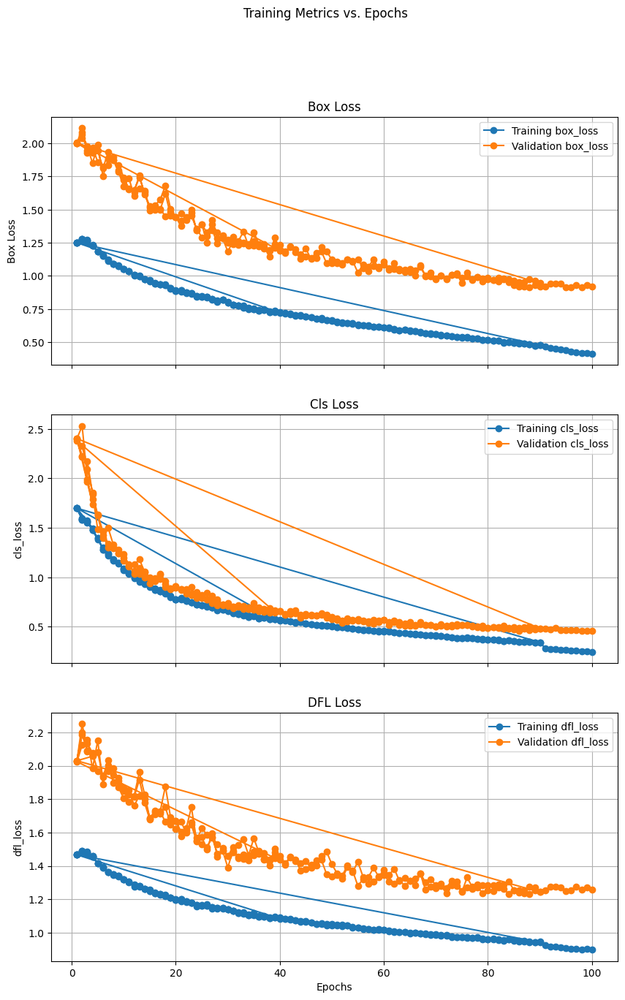

In [23]:
fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(10, 15), sharex=True)

### Training and Validation Box Loss
ax1.set_title('Box Loss')
ax1.plot(df['epoch'], df['train/box_loss'], label='Training box_loss', marker='o', linestyle='-')
ax1.plot(df['epoch'], df['val/box_loss'], label='Validation box_loss', marker='o', linestyle='-')
ax1.set_ylabel('Box Loss')
ax1.legend()
ax1.grid(True)

### Training and Validation cls_loss
ax2.set_title('Cls Loss')
ax2.plot(df['epoch'], df['train/cls_loss'], label='Training cls_loss', marker='o', linestyle='-')
ax2.plot(df['epoch'], df['val/cls_loss'], label='Validation cls_loss', marker='o', linestyle='-')
ax2.set_ylabel('cls_loss')
ax2.legend()
ax2.grid(True)

### Training and Validation dfl_loss
ax3.set_title('DFL Loss')
ax3.plot(df['epoch'], df['train/dfl_loss'], label='Training dfl_loss', marker='o', linestyle='-')
ax3.plot(df['epoch'], df['val/dfl_loss'], label='Validation dfl_loss', marker='o', linestyle='-')
ax3.set_xlabel('Epochs')
ax3.set_ylabel('dfl_loss')
ax3.legend()
ax3.grid(True)

plt.suptitle('Training Metrics vs. Epochs')
plt.show()

Prediction

In [38]:
results_path = os.path.join(OUTPUT_DIR, f'runs/detect/{BASE_MODEL}_{EXP_NAME}/')
results_path

best_model_path = results_path + 'weights/best.pt'
best_model = YOLO(best_model_path)

In [39]:
test_files = glob.glob('archive/source_files/source_files/*.*')

In [40]:
for filenames in test_files:
    ext = filenames.split('/')[-1].split('.')[-1]
    if (ext=='jpg'):
        results = best_model.predict(source = filenames, save = True, conf = 0.5, line_width = 2)


image 1/1 d:\Projects\ppe\archive\source_files\source_files\construction-safety.jpg: 448x640 3 Hardhats, 3 Persons, 3 Safety Vests, 19.5ms
Speed: 2.0ms preprocess, 19.5ms inference, 2.0ms postprocess per image at shape (1, 3, 448, 640)
Results saved to runs\detect\predict5

image 1/1 d:\Projects\ppe\archive\source_files\source_files\portrait-of-woman-with-mask-and-man-with-safety-glasses-on-a-construction-HX01FH.jpg: 480x640 2 Hardhats, 1 Mask, 1 NO-Mask, 1 Person, 2 Safety Vests, 19.9ms
Speed: 2.0ms preprocess, 19.9ms inference, 2.0ms postprocess per image at shape (1, 3, 480, 640)
Results saved to runs\detect\predict5

image 1/1 d:\Projects\ppe\archive\source_files\source_files\schupan_japan1web.jpg: 384x640 5 Hardhats, 1 NO-Hardhat, 6 NO-Masks, 6 Persons, 5 Safety Vests, 17.0ms
Speed: 2.0ms preprocess, 17.0ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs\detect\predict5

image 1/1 d:\Projects\ppe\archive\source_files\source_files\two-young-c

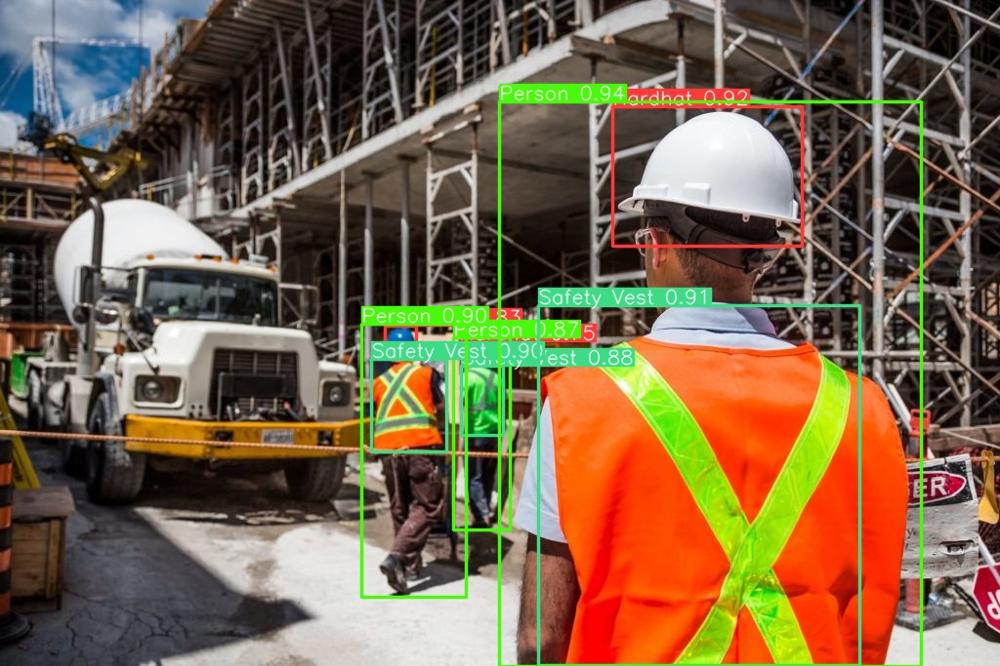

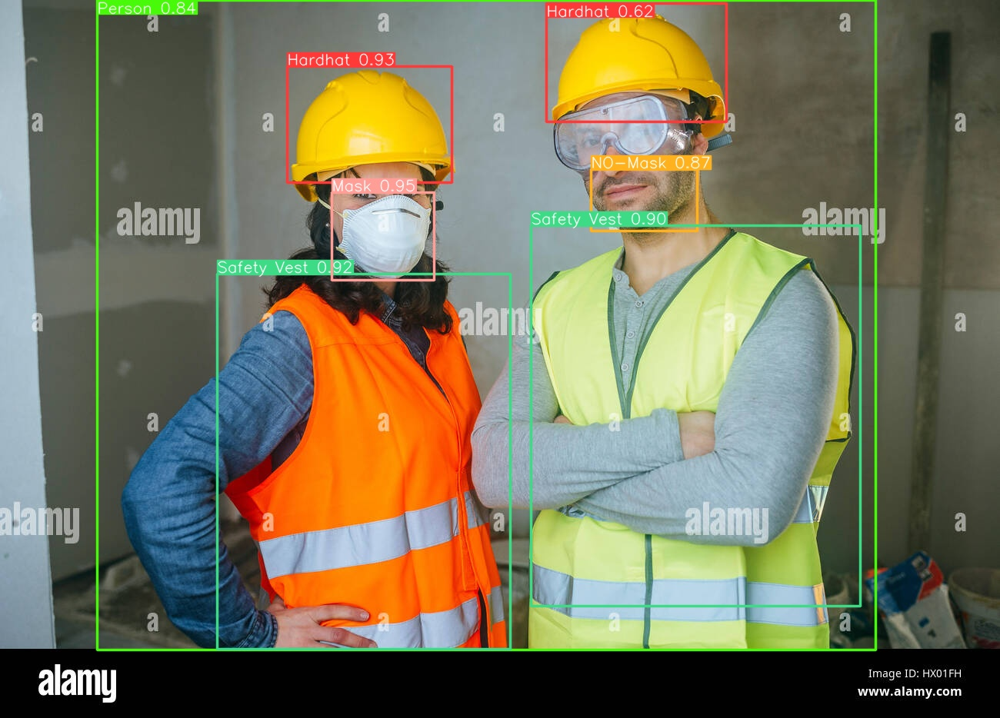

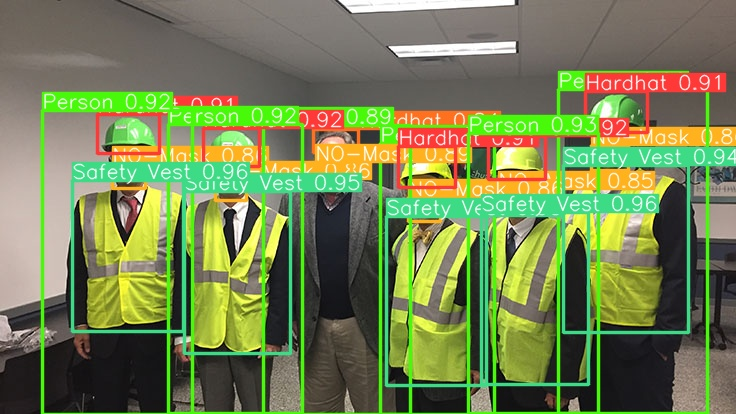

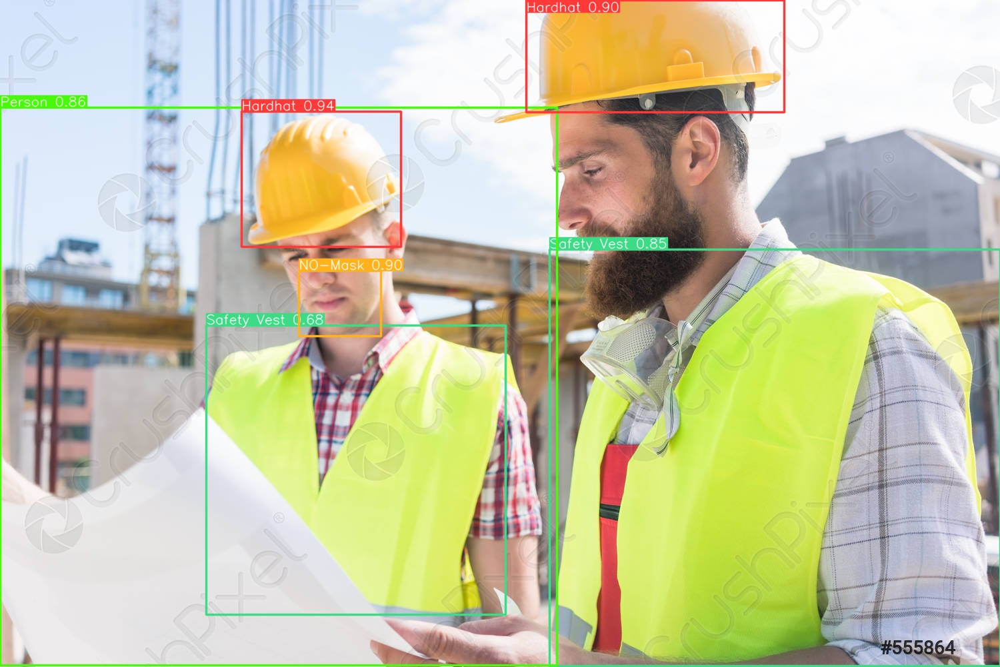

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

<Figure size 2500x2500 with 0 Axes>

In [4]:
predict_files = 'runs/detect/predict'
for idx, files in enumerate(glob.glob(predict_files + '/*.*')):
    try:
        plt.figure(figsize = (25, 25))
        display(Image.open(files))
    except Exception as e:
        print(f"Skipping file {files} due to error: {e}")